<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW1_JudsonLimaRedo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 1

Judson Lima

OPTI 556, Fall 2023

##Libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d, convolve
from skimage import color, data, restoration, exposure
from skimage import io, transform, img_as_float, img_as_ubyte
from google.colab import files
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams.update({'font.size': 16})

from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display, clear_output
import ipywidgets as widgets
import matplotlib as mpl
import scipy.integrate as integrate

from scipy.interpolate import interp1d, InterpolatedUnivariateSpline, splrep, sproot
from scipy import integrate
%matplotlib inline

import pywt

import warnings
warnings.filterwarnings('ignore')


##Fourier series estimation of a signal:

Estimation is done using 4 signals, intent is to show a similar effect to Figure 2.4 of the textbook. First step is to apply the initialization code, this then can be used to show a Fourier series representing a signal $f(x)$ within a given interval [-L , L].

  First function,
  $$
  f(x)=\left \lbrace {
     \begin{aligned}
        0 &\text{ for } x \leq -.25\\
        1 &\text{ for } -.25<x\leq .25\\
        0 &\text{ for } .25<x
    \end{aligned}}\right.
  $$


  Second function,
  $$
  f(x)=\left \lbrace {
     \begin{aligned}
        0 &\text{ for } x \leq -.25\\
        2*(x+.25) &\text{ for } -.25<x\leq .25\\
        1 &\text{ for } .25<x
    \end{aligned}}\right.
  $$

  Third function,
  $$
  f(x)=\left \lbrace {
     \begin{aligned}
        0 &\text{ for } x \leq -.25\\
        4(x+.25) &\text{ for } -.25<x\leq 0\\
        -4(x-.25) &\text{ for } 0<x\leq .25\\
        0 &\text{ for } .25<x
    \end{aligned}}\right.
  $$

  Forth function,
  $$
  f(x)=\left \lbrace {
     \begin{aligned}
        0 &\text{ for } x \leq -.25\\
        1 &\text{ for } -.25<x\leq 0\\
        -1 &\text{ for } 0<x\leq .25\\
        0 &\text{ for } .25<x
    \end{aligned}}\right.
  $$

In [ ]:
# function 1
def f1(x):
  if x<-.25:
    f1=0.
  elif x<.25:
    f1=1.
  else:
    f1=0.
  return f1

# function 2
def f2(x):
  if x<-.25:
    f2=0.
  elif x<.25:
    f2=2.*(x+.25)
  else:
    f2=1.
  return f2

#function 3
def f3(x):
  if x<-.25:
    f3=0.
  elif x<=0:
    f3=4.*(x+.25)
  elif x<=.25:
    f3=-4.*(x-.25)
  else:
    f3=0.
  return f3

#function 4
def f4(x):
  if x<-.25:
    f4=0.
  elif x<0:
    f4=1.
  elif x<.25:
    f4=-1.
  else:
    f4=0.
  return f4

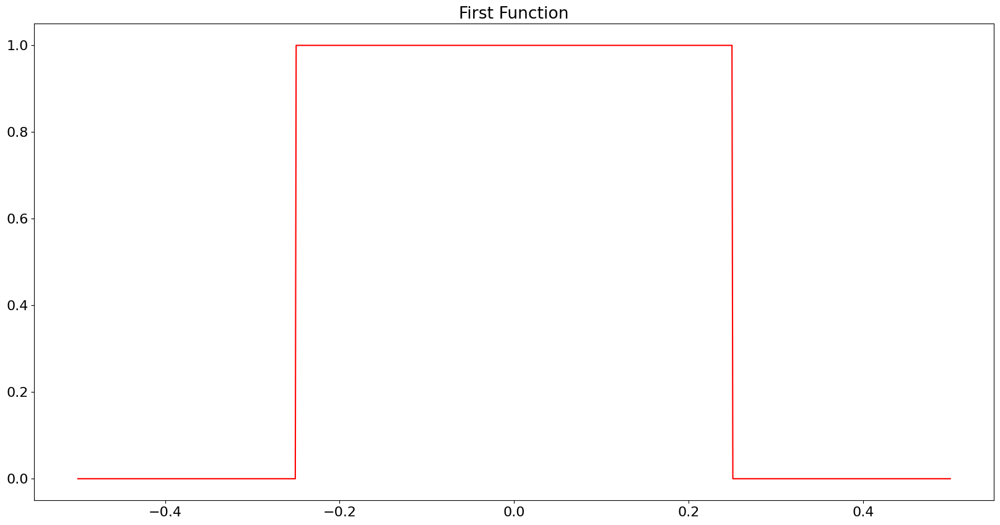

In [ ]:
from numpy import vectorize
vf1 = vectorize(f1)
plt.plot(np.linspace(-.5,.5,1000),vf1(np.linspace(-.5,.5,1000)),'r')
plt.title("First Function")
plt.savefig('exampleFF.png')


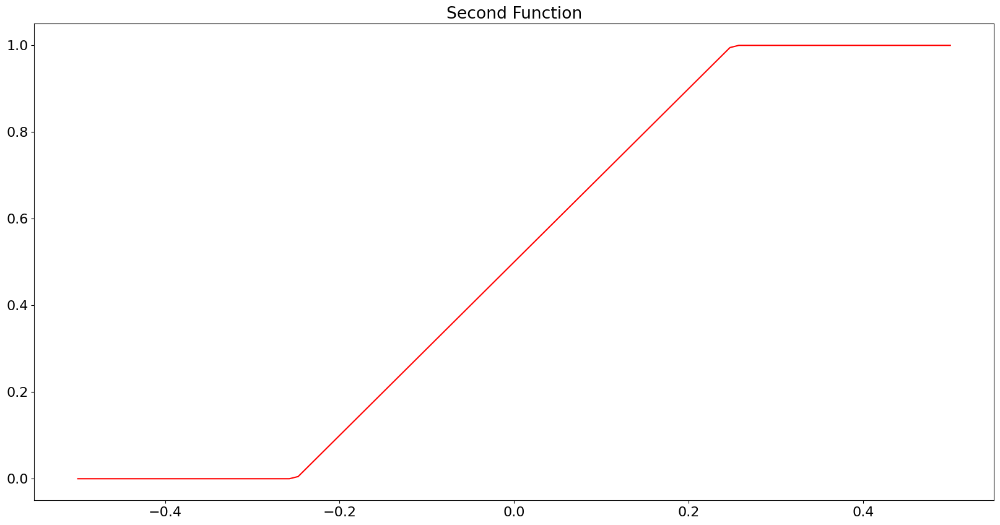

In [ ]:
vf2 = vectorize(f2)
plt.plot(np.linspace(-.5,.5,100),vf2(np.linspace(-.5,.5,100)),'r')
plt.title("Second Function")
plt.savefig('exampleSF.png')

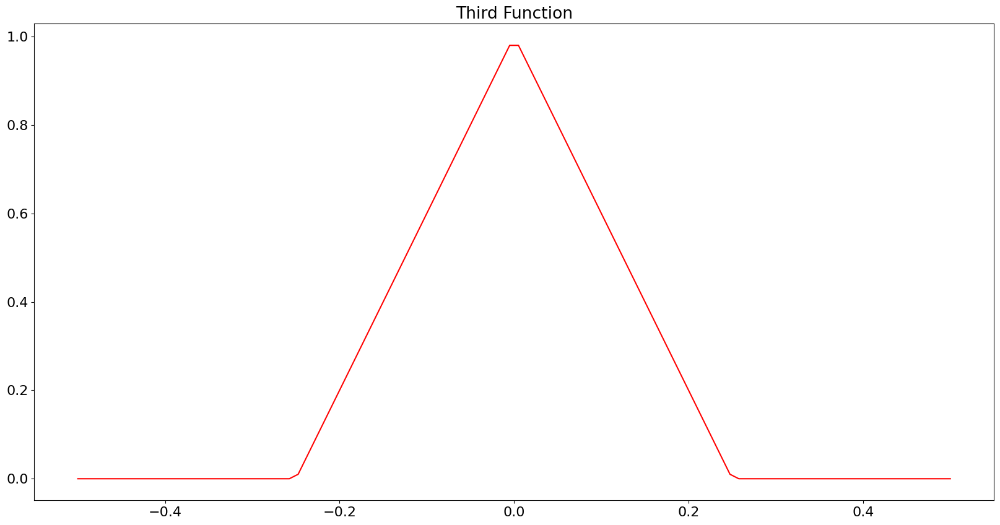

In [ ]:
vf3 = vectorize(f3)
plt.plot(np.linspace(-.5,.5,100),vf3(np.linspace(-.5,.5,100)),'r')
plt.title("Third Function")
plt.savefig('exampleTF.png')

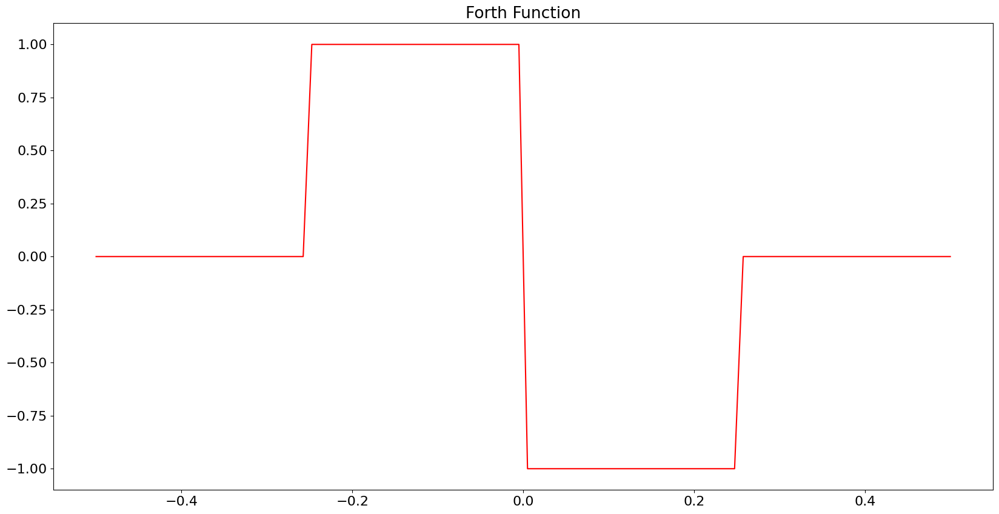

In [ ]:
vf4 = vectorize(f4)
plt.plot(np.linspace(-.5,.5,100),vf4(np.linspace(-.5,.5,100)),'r')
plt.title("Forth Function")
plt.savefig('exampleFhF.png')

##Fourier series estimation of a signal

As shown below, with more terms, a clser approximation can be seen. The Gibbs phenomena can been seen throughout the approximations, especially around step-like patterns (ex, value goes from 1 to 0).

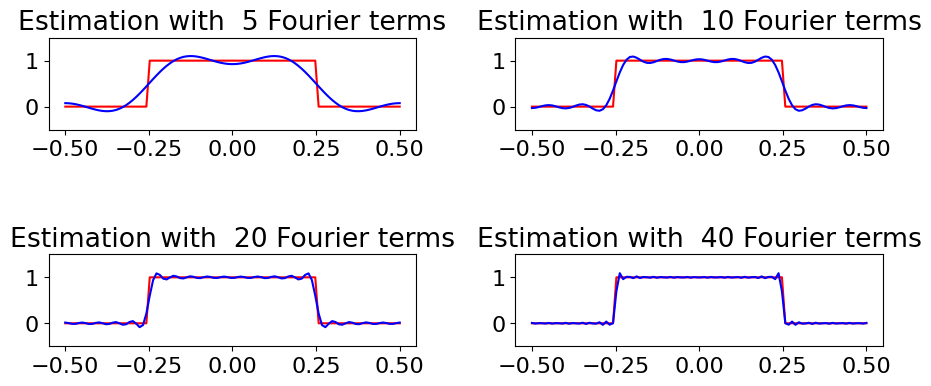

In [ ]:

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf1(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf1(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf1(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFFSexpansion.png')

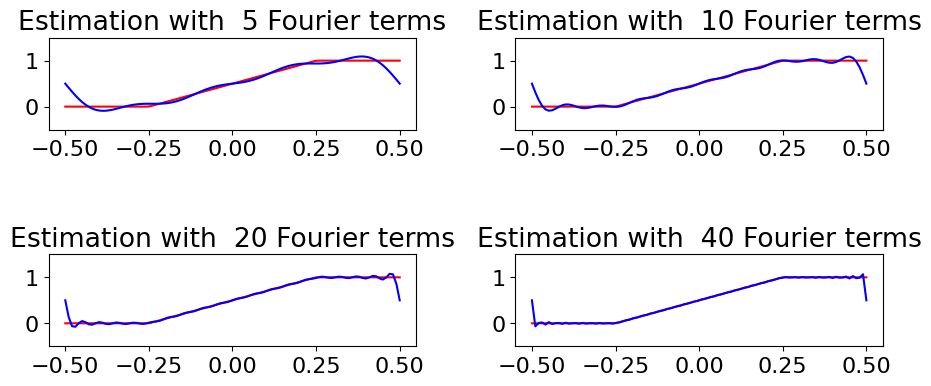

In [ ]:

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf2(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf2(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf2(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleSFSexpansion.png')

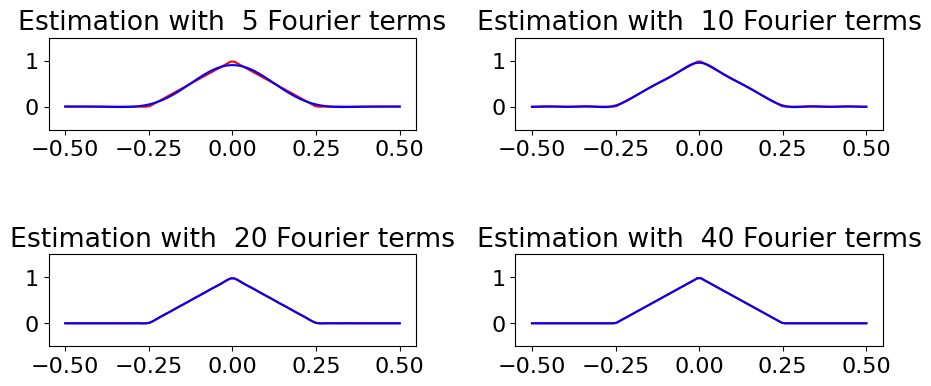

In [ ]:

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf3(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf3(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf3(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleTFSexpansion.png')

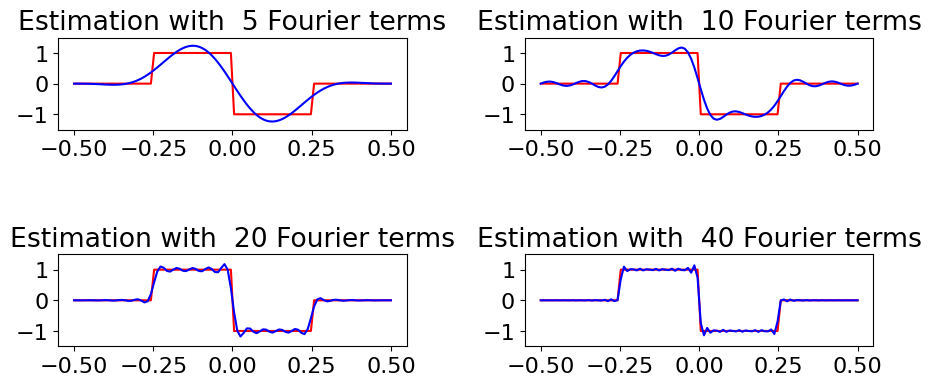

In [ ]:

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf4(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf4(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf4(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-1.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFhFSexpansion.png')

## DFT for Various signals

The sampling theorem states that a bandlimited function is exactly represented by the discrete sum of its values at appropriately spaced sample points using the interpolation function $sinc(x)$.

The sampling theorem states that $f_B(x)$ can be reconstructed using the interpolation rule as long as the sampling period, $∆$ , does not exceed the *Nyquist limit* $\frac{1}{2B}$ from the relationship $x = \frac{n}{2B}$.

The later section,"Using a B-Spline interpolator instead", shows the use of a spline interpolator, B-spline interpolation is identical to Shannon interolation as the order approaches infinity. Unfortunately, since the tails of the sinc extend to infinity, Shannon interpolation is computationally intense. The B-splines of finite order have finite support and thus are convenient for approximation of Shannon interpolation, this makes them alot easier to work with for computation.



##List of signals used

Function 1:
$f(x)=cos (\frac{2\pi }{x}) sinc(\frac{\pi x}{5})
$

Function 2:
$f(x)=\frac{1}{\sqrt(2\pi\sigma^2)}e^-\frac{ x^2}{2\sigma^2} cos (\frac{2\pi }x)
$

Function 3:
$f(x)=sinc({.5\pi x})
$


Function 1, .1 sampling rate, B = 5

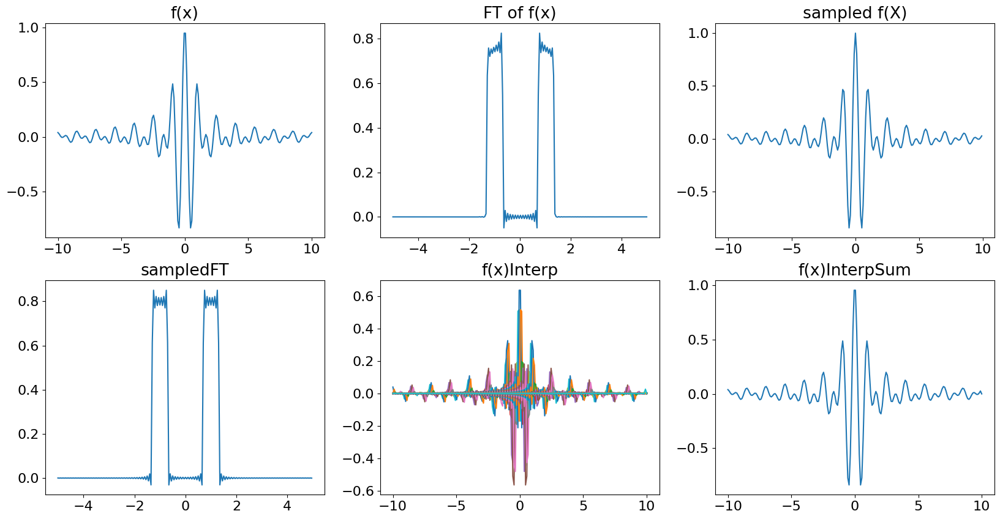

In [ ]:
X=10
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 1, .2 sampling rate, B = 2.5

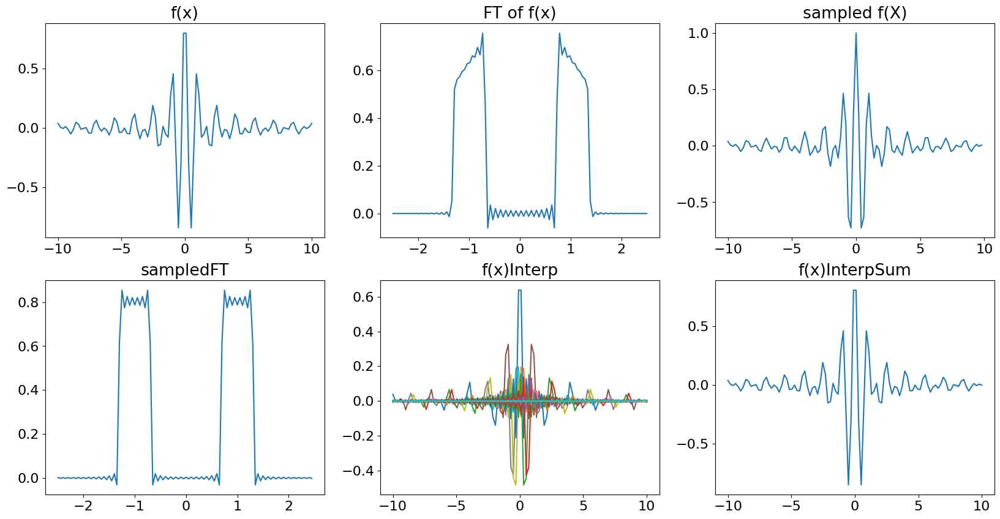

In [ ]:
X=10
samplingRate=.2
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))

plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')
plt.savefig('cos_sinc_p1_Shannon.png')

Function 1, .5/1.1 sampling rate, B = 1.1

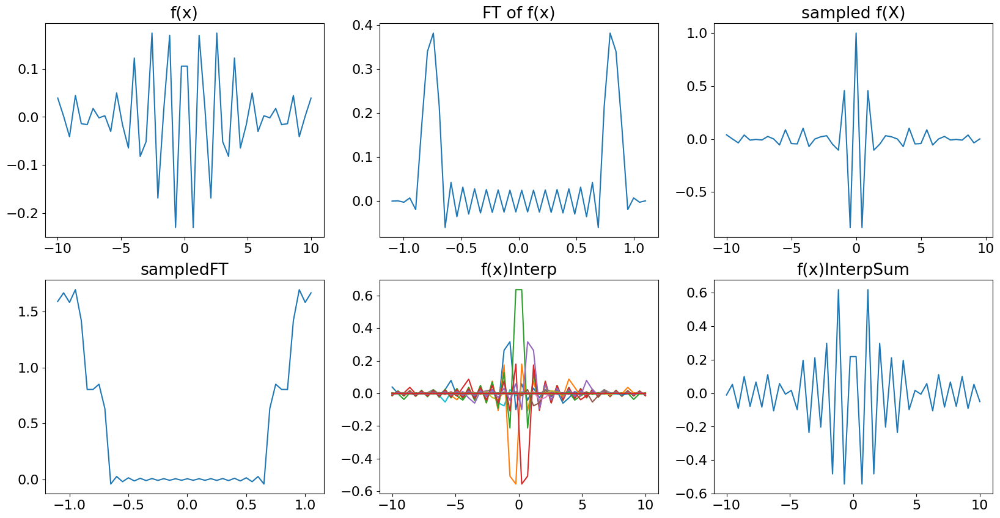

In [ ]:
X=10
samplingRate=.5/1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 2, .1 sampling rate, B = 5

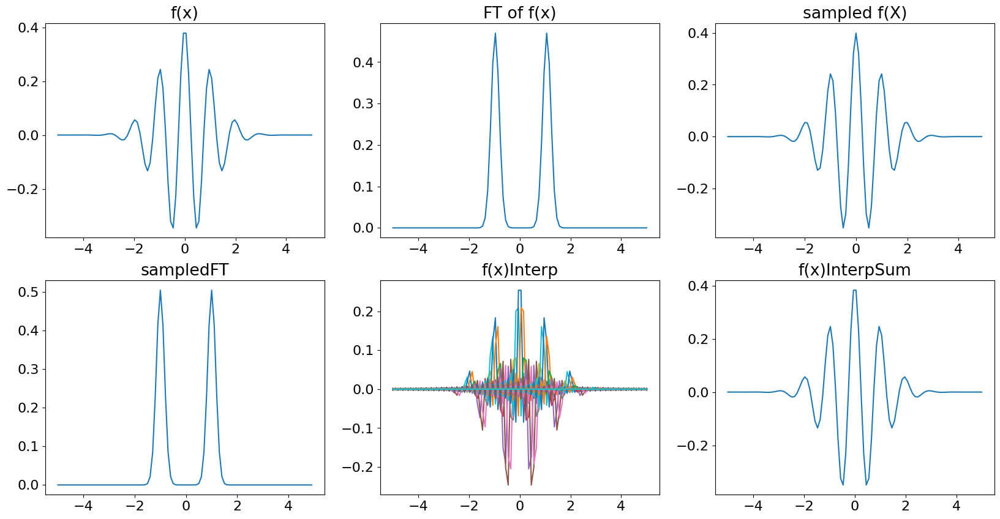

In [ ]:
X=5
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 2, .2 sampling rate, B = 2.5

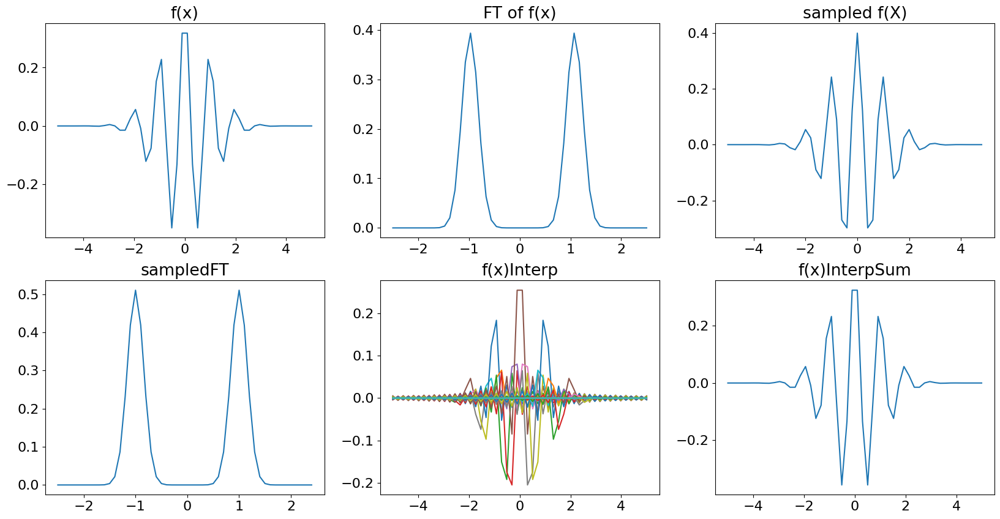

In [ ]:
X=5
samplingRate=.2
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 2, .5/1.1 sampling rate, B = 1.1

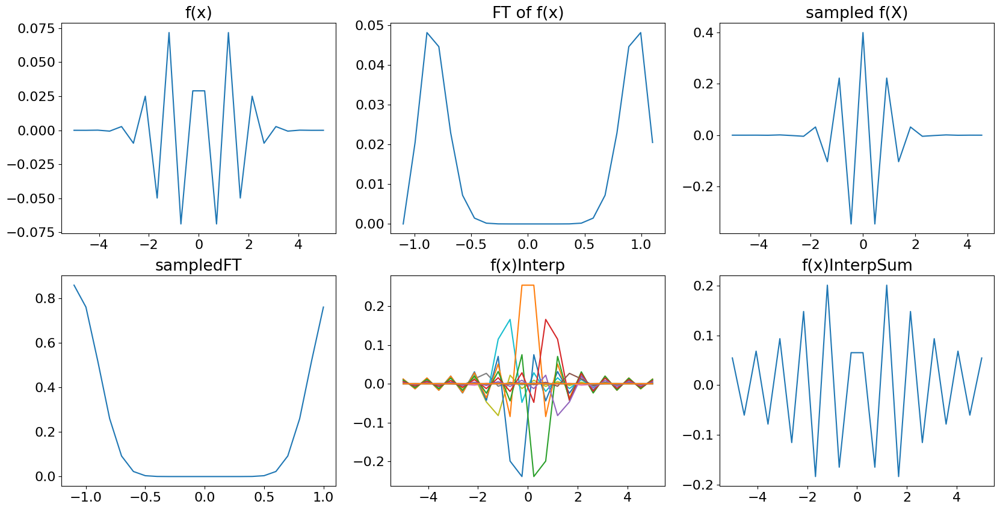

In [ ]:
X=5
samplingRate=.5/1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 3, .1 sampling rate, B = 5

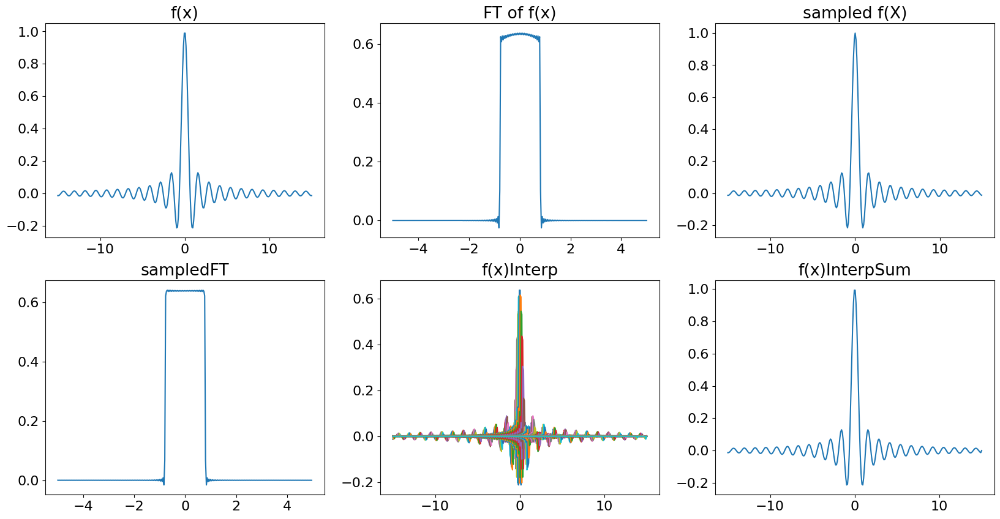

In [ ]:
X=15
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 3, 1/3 sampling rate, B = 1.5

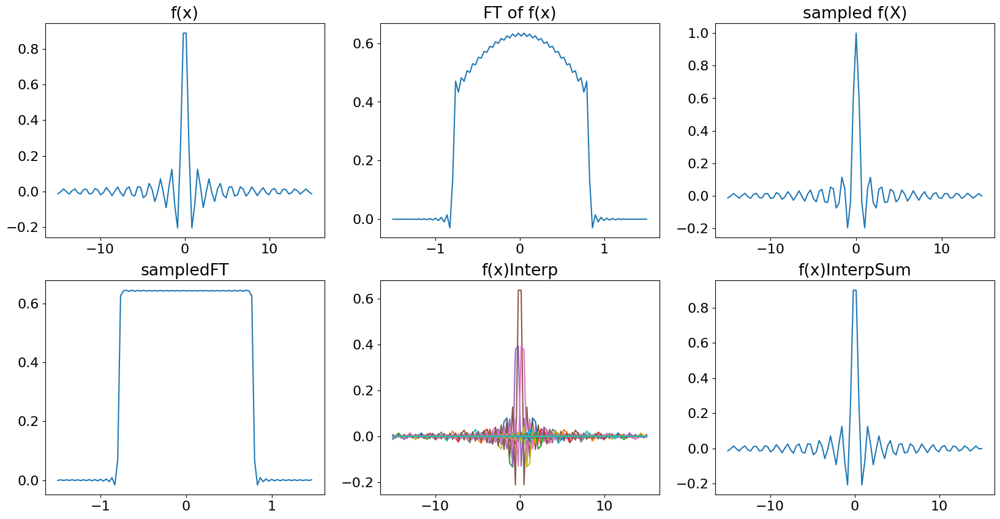

In [ ]:
X=15
samplingRate=1/3
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

Function 3, .5/1.1 sampling rate, B = 1.1

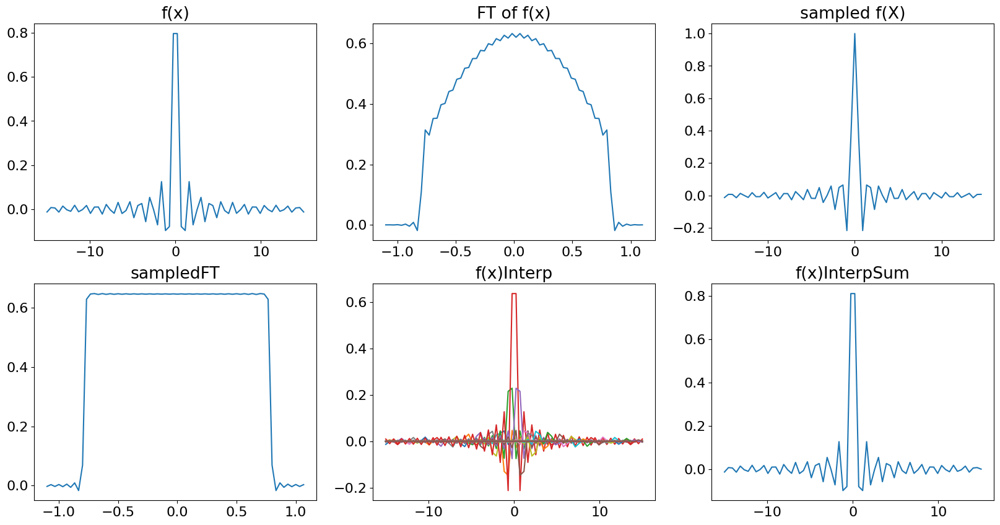

In [ ]:
X=15
samplingRate=.5/1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f

# sampled plot based on N
plt.subplot(2,3,1)
plt.plot(xrange,f(xrange))
plt.title('f(x)')
plt.subplot(2,3,2)
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(xrange))))))
plt.title('FT of f(x)')
plt.subplot(2,3,3)
srange=np.arange(-X,X,samplingRate)
plt.plot(srange,f(srange))
plt.title('sampled f(X)')
usrange=srange/(samplingRate*2*X)
plt.subplot(2,3,4)
plt.plot(usrange,(1./(usrange[-1]-usrange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(f(srange))))))
plt.title('sampledFT')

interP=np.zeros(N)
for pip in np.arange(len(srange)):
  plt.subplot(2,3,5)
  plt.plot(xrange,f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+f(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.title('f(x)Interp')
plt.subplot(2,3,6)
plt.plot(xrange,interP)
plt.title('f(x)InterpSum')

plt.savefig('cos_sinc_p1_Shannon.png')

## Wavelet tranformation

Using three images that are uploaded tranfomations are done using python code. Rotating the images gives a complete different wavelet pattern, depending on the orientation the sparsity of the image can change while keeping the same information due to the transform.



In [3]:
!wget https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/DreamCatcher.jpg

--2023-12-01 07:46:27--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/DreamCatcher.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3475183 (3.3M) [image/jpeg]
Saving to: ‘DreamCatcher.jpg.2’

DreamCatcher.jpg.2  100%[===================>]   3.31M  --.-KB/s    in 0.08s   

2023-12-01 07:46:27 (42.8 MB/s) - ‘DreamCatcher.jpg.2’ saved [3475183/3475183]



In [4]:
!wget https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Poyboy.jpg

--2023-12-01 07:46:28--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Poyboy.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2356784 (2.2M) [image/jpeg]
Saving to: ‘Poyboy.jpg.2’

Poyboy.jpg.2        100%[===================>]   2.25M  --.-KB/s    in 0.07s   

2023-12-01 07:46:28 (30.5 MB/s) - ‘Poyboy.jpg.2’ saved [2356784/2356784]



In [5]:
!wget https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Skeleton.jpg

--2023-12-01 07:46:28--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Skeleton.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1497791 (1.4M) [image/jpeg]
Saving to: ‘Skeleton.jpg.2’

Skeleton.jpg.2      100%[===================>]   1.43M  --.-KB/s    in 0.07s   

2023-12-01 07:46:28 (19.8 MB/s) - ‘Skeleton.jpg.2’ saved [1497791/1497791]



In [6]:
pop1=io.imread('DreamCatcher.jpg',as_gray=True)

In [393]:
pop2=io.imread('Poyboy.jpg',as_gray=True)

In [394]:
pop3=io.imread('Skeleton.jpg',as_gray=True)

In [9]:
np.shape(pop1)

(4032, 3024)

In [395]:
np.shape(pop2)

(4032, 3024)

In [396]:
np.shape(pop3)

(4032, 3024)

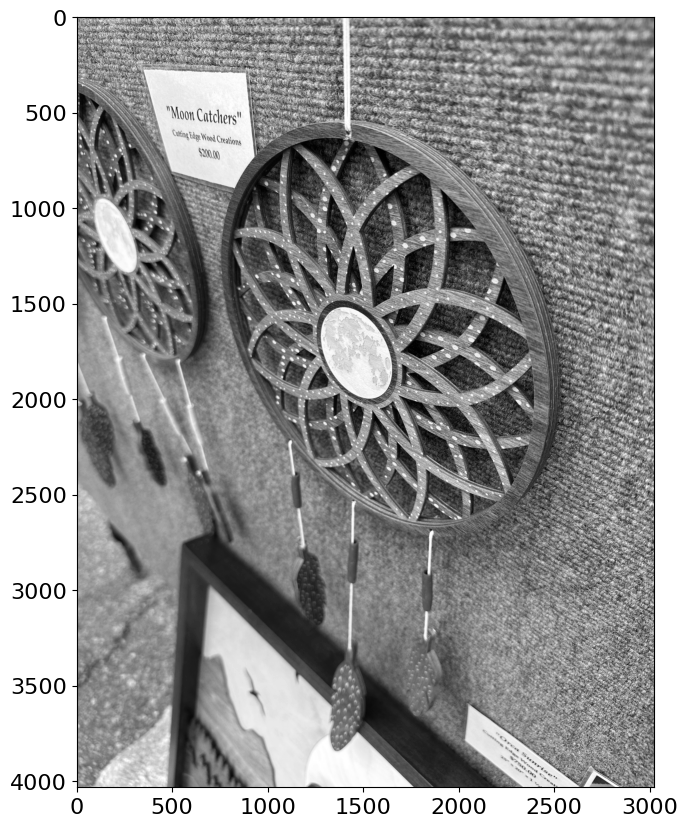

In [12]:
plt.imshow(pop1,cmap=plt.cm.gray)

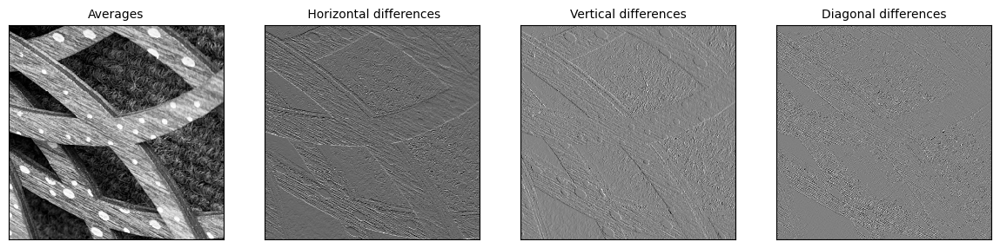

In [13]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(pop1[1750:2262,1750:2262], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('DreamCatcher1.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

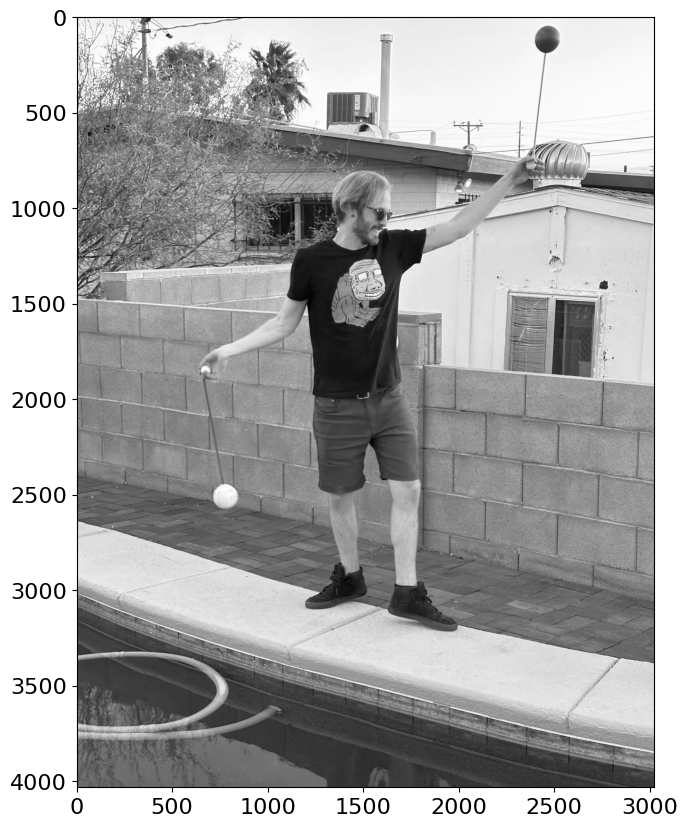

In [405]:
plt.imshow(pop2,cmap=plt.cm.gray)

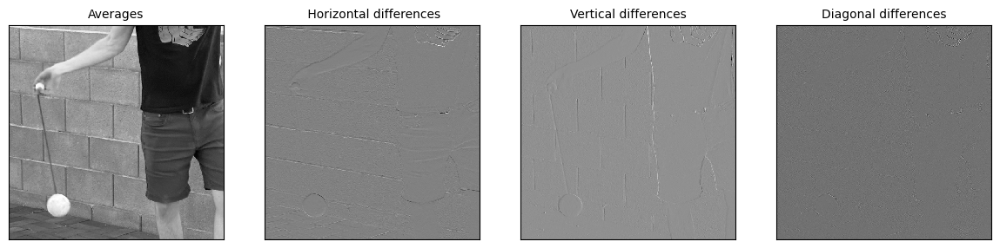

In [403]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(pop2[1500:2700,500:1700], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('poyboy.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

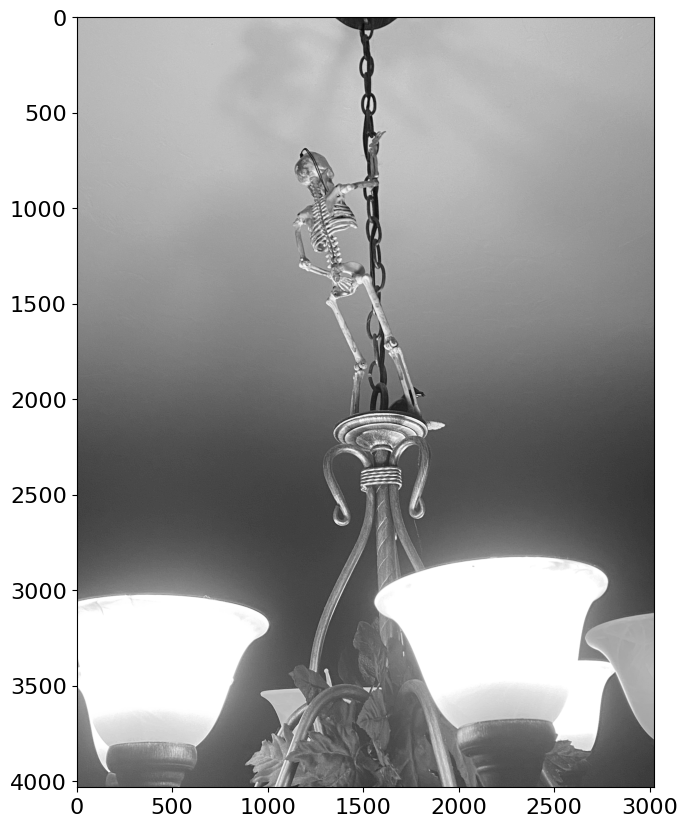

In [398]:
plt.imshow(pop3,cmap=plt.cm.gray)

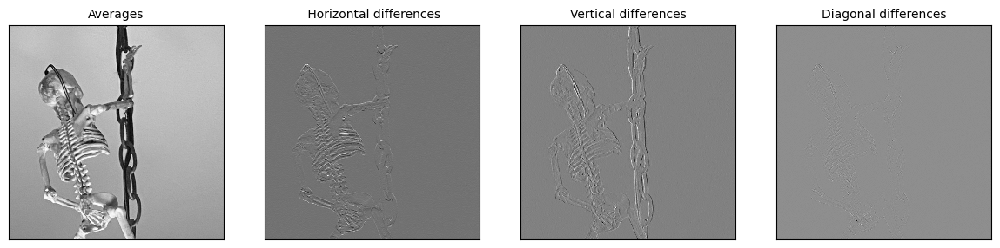

In [404]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(pop3[500:1500,1000:2000], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('skeleton.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

In [14]:
pop1_1=transform.rotate(pop1, 35)

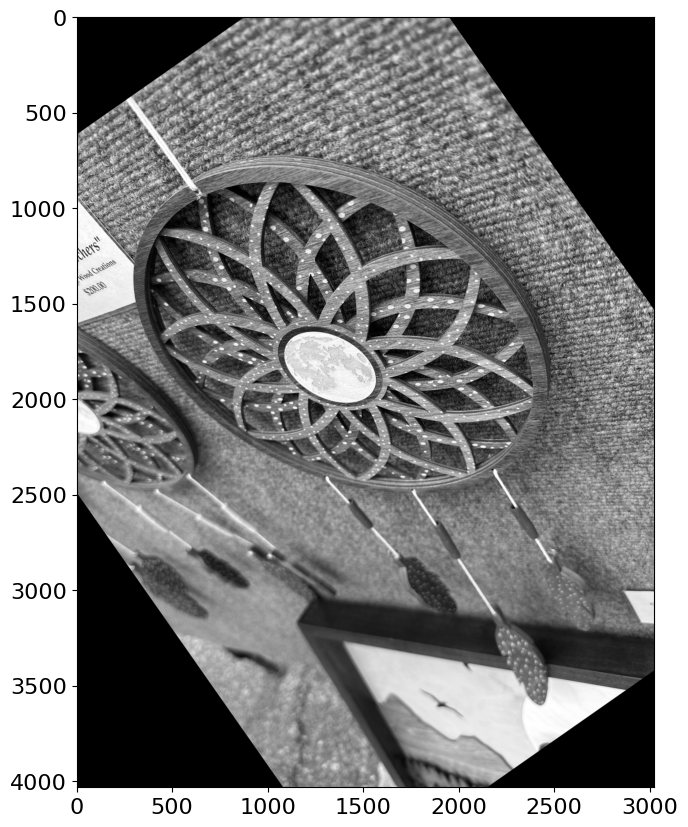

In [15]:
plt.imshow(pop1_1, cmap=plt.cm.gray)

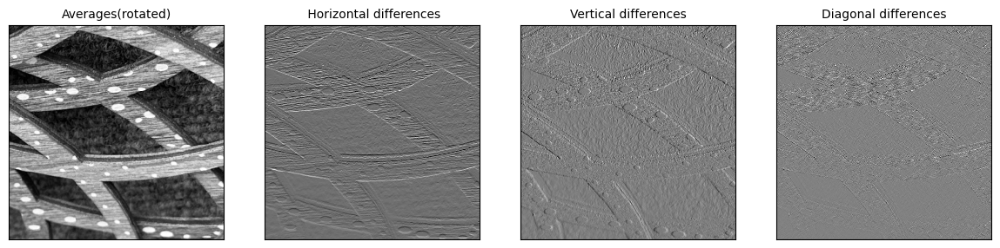

In [16]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages(rotated)', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(pop1_1[1750:2262,1750:2262], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('DreamCatcher2.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

### Results of rotation
Changing the rotation by 35 degrees changed the location of the differences profile compared to the 0 degrees image. This could be useful when more sparse data from the same image just using a simple translation of the initial image.

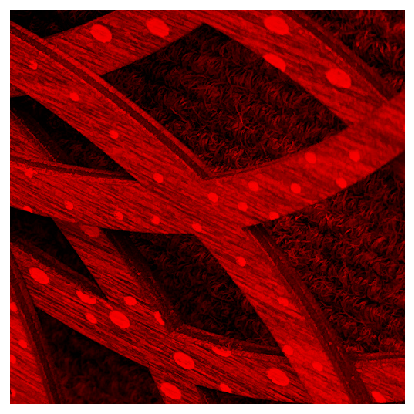

In [369]:
px = 1/plt.rcParams['figure.dpi']  # pixel in inches
ax = plt.figure(figsize=(512*px,512*px))

image1_2 = img_as_float(color.gray2rgb(pop1[1750:2262,1750:2262]))
red_multiplier = [1, 0, 0]
red_img1 = red_multiplier * image1_2
#red_img1 = img_as_ubyte(red_img1)


plt.imshow(red_img1, cmap=plt.cm.gray, interpolation='nearest')

plt.axis('off')

plt.savefig('red_overlay1.jpg', dpi=130, bbox_inches='tight')

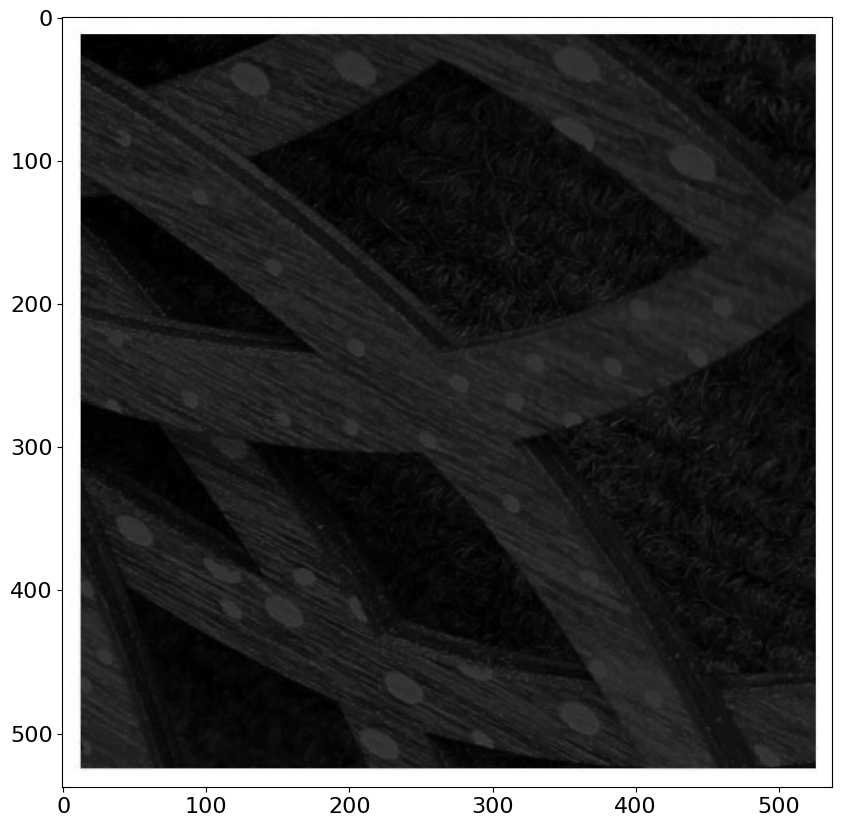

In [370]:
red_img1 = io.imread('red_overlay1.jpg',as_gray=True)
red_img1 = ((red_img1) * 255).astype(np.uint8)

plt.imshow(red_img1,cmap=plt.cm.gray)

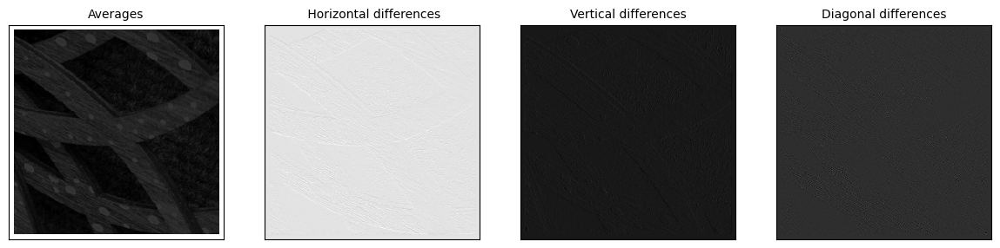

In [371]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(red_img1, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('DreamCatcher4.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

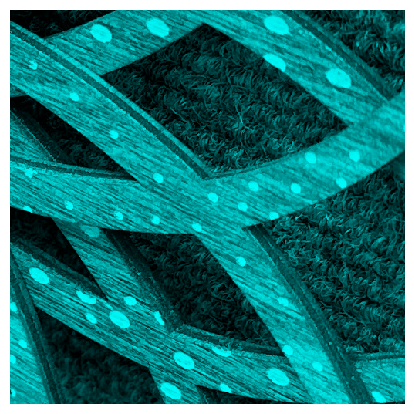

In [387]:
px = 1/plt.rcParams['figure.dpi']  # pixel in inches
plt.figure(figsize=(512*px,512*px))

image1_2 = img_as_float(color.gray2rgb(pop1[1750:2262,1750:2262]))
cyan_multiplier = [0, 1, 1]
cyan_img1 = cyan_multiplier * image1_2

plt.imshow(cyan_img1, cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')


plt.savefig('cyan_overlay1.jpg', dpi=130, bbox_inches='tight')

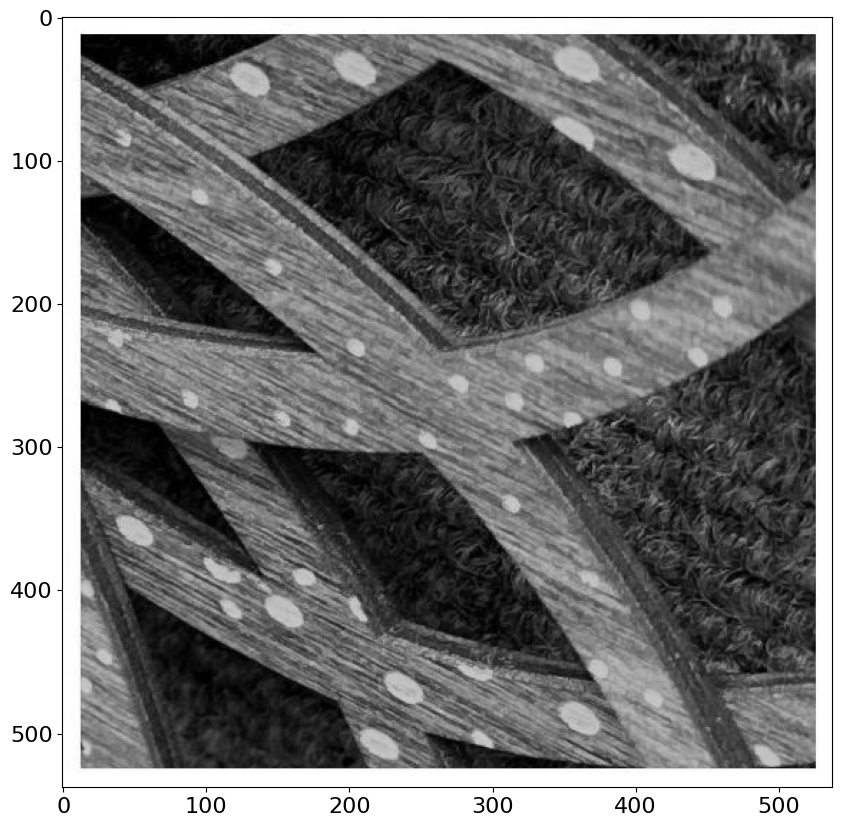

In [390]:
cyan_img1 = io.imread('cyan_overlay1.jpg',as_gray=True)
cyan_img1 = ((cyan_img1) * 255).astype(np.uint8)

plt.imshow(cyan_img1, cmap=plt.cm.gray)

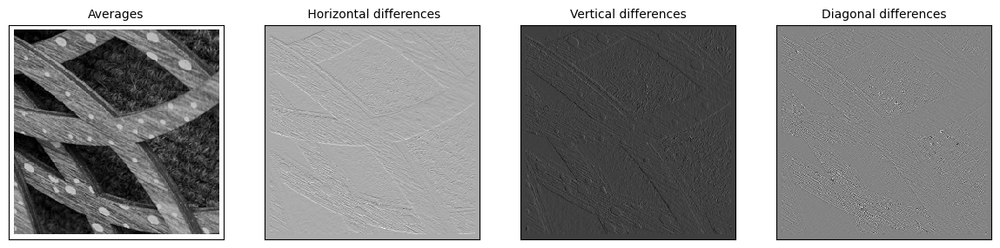

In [392]:
# Wavelet transform of image, and plot approximation and details
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(cyan_img1, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig('DreamCatcher5.jpg', bbox_inches = 'tight', pad_inches = 0)
fig.show()

## Using a B-Spline interpolator to mimic Aliasing and low pass filtering

Using the same functions for a few of the signal variations from the last section we can see how they compare to the Shannon interpolation.

###Aliasing
The relationship between the signal and the measurements is impacted by the sampling rate and the sampling function. If the sampling rate is too low, aliasing will occur and high frequency signal components will be wrapped into lower frequency measurement signals.

###Low pass filtering
The sampling function determines the transfer function. For energy conserving systems, modulation transfer function is less then 1. Due to this, the frequencies are supressed and fain must be introduced to attempt to recover the signal. Systems use a low pass measurment where over a range,bandpass, is determined to be acceptable. A narrower sampling function corresponds to higher frequency bandpass, a wider sampling function leads to narrower bandpass. The final transfer function will be the product of the optical transfer function and the sampling transfer function.

###List of signals

Function 1:
$f(x)=cos (\frac{2\pi }{x}) sinc(\frac{\pi x}{5})
$

Function 2:
$f(x)=\frac{1}{\sqrt(2\pi\sigma^2)}e^-\frac{ x^2}{2\sigma^2} cos (\frac{2\pi }x)
$

Function 3:
$f(x)=sinc({.5\pi x})
$

Low-pass filtering method based on Harr sampling method where:
$h(x)={\rm rect}\left (\frac{x}{\Delta}\right)$


First signal,

5x over sampling
sampling rate .1, 5 times Nyquist

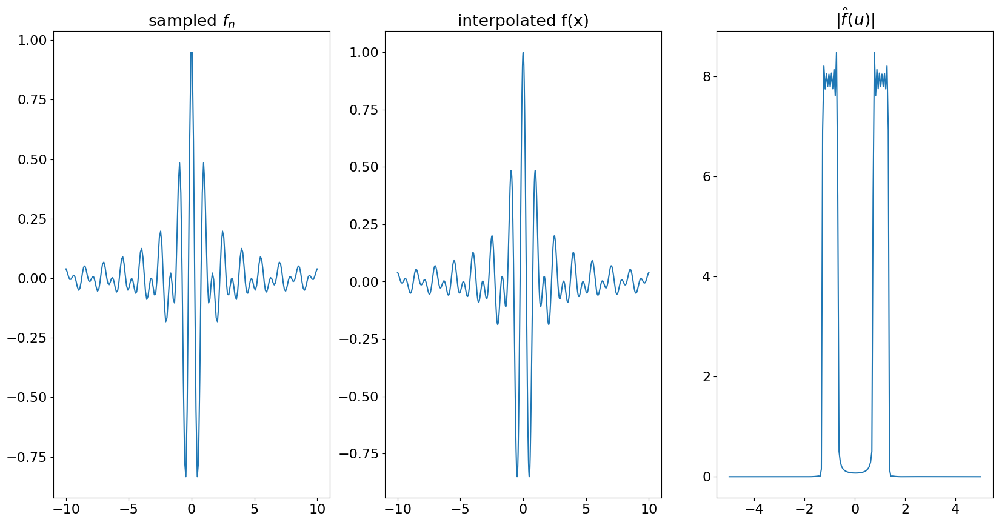

In [ ]:
X=10
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_sinc5XNyquist.png')

First signal,

1.5x over sampling
sampling rate 1/3, 1.5 times Nyquist

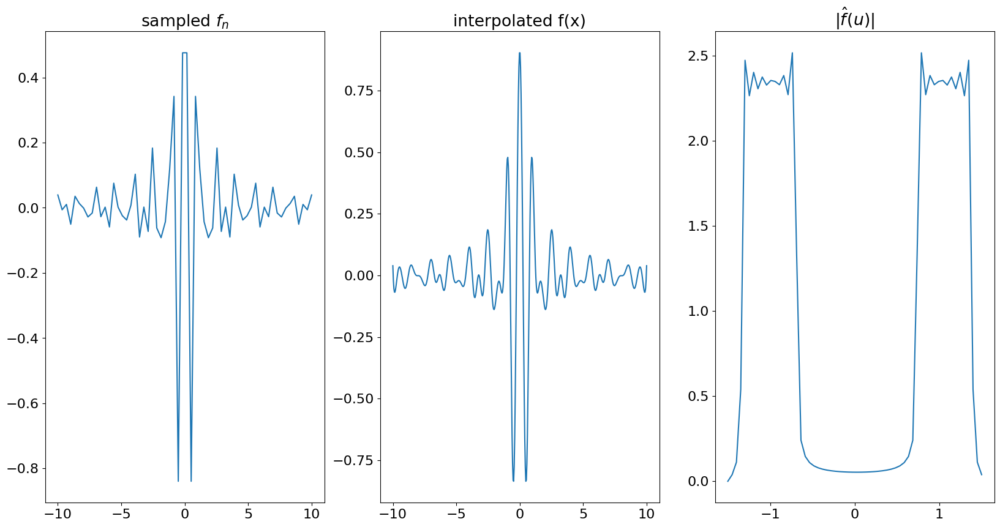

In [ ]:
X=10
samplingRate=1/3
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_sinc1p5XNyquist.png')

First signal,

1.25x over sampling
sampling rate .4, 1.25 times Nyquist

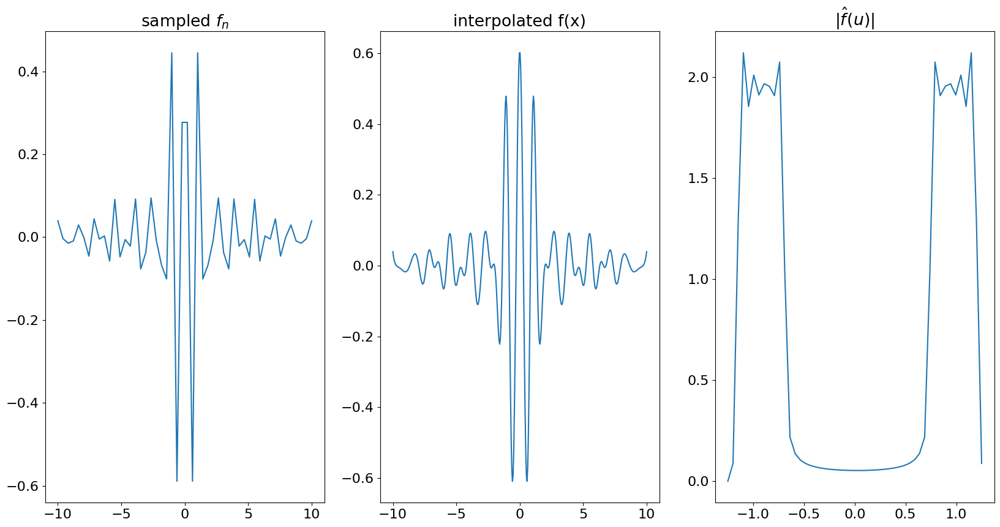

In [ ]:
X=10
samplingRate=.4
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_sinc1p25XNyquist.png')

First signal,

1.1x under sampling
sampling rate .5$\times$1.1, 1.1 times Nyquist

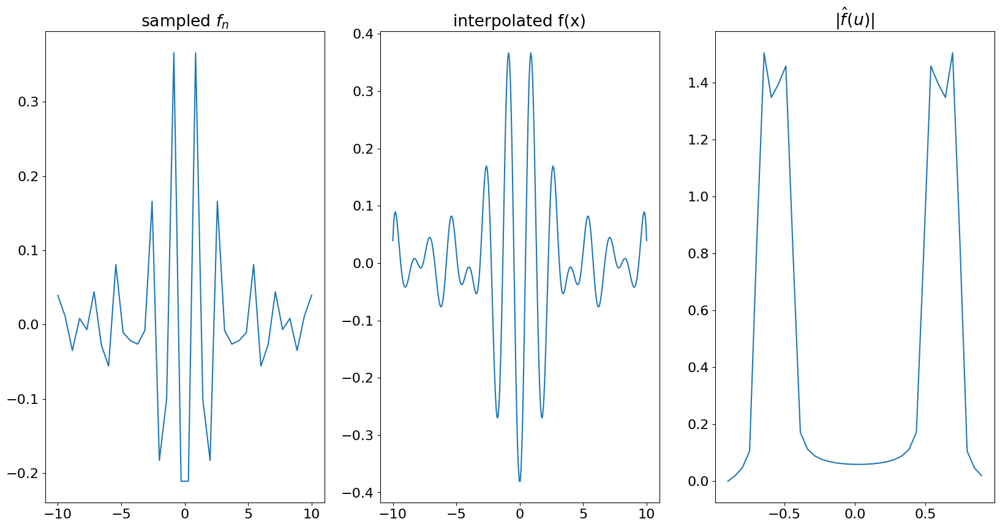

In [ ]:
X=10
samplingRate=.5*1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_sinc1p1XNyquist.png')

Second signal,

5x over sampling
sampling rate .1, 5 times Nyquist

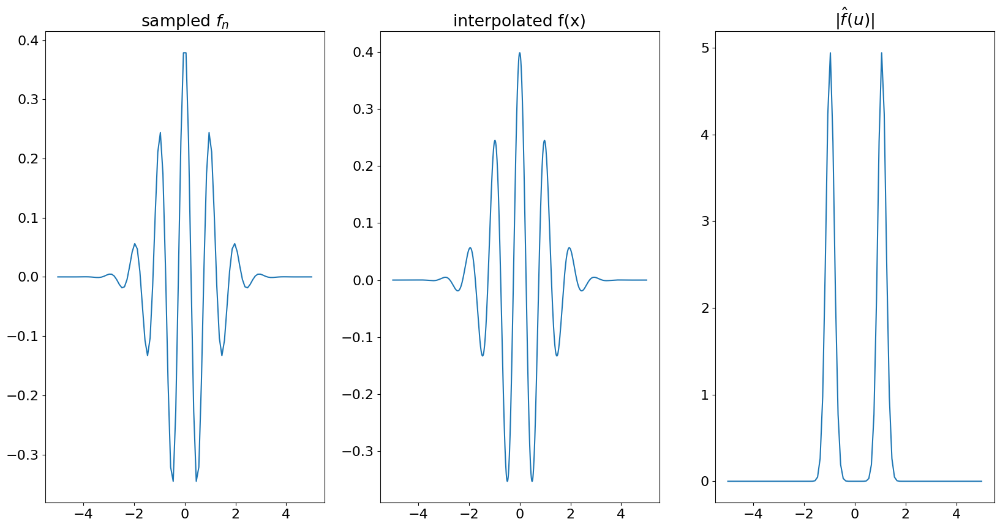

In [ ]:
X=5
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
sigma=1
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_gauss5XNyquist.png')

Second signal,

1.5x over sampling
sampling rate 1/3, 1.5 times Nyquist

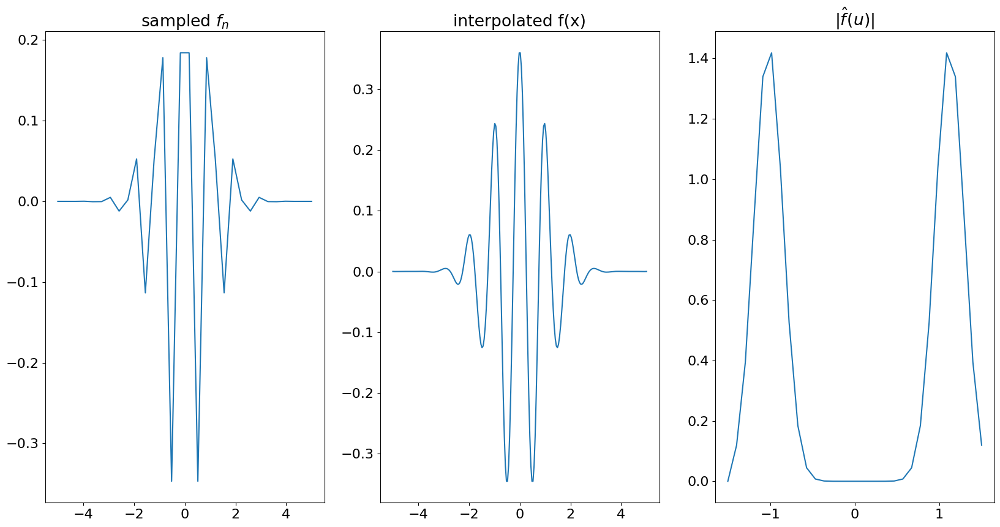

In [ ]:
X=5
samplingRate=1/3
N=np.int(2*X/samplingRate)
B=N/(4*X)
sigma=1
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_gauss1p5XNyquist.png')

Second signal,

1.25x over sampling
sampling rate .4, 1.25 times Nyquist

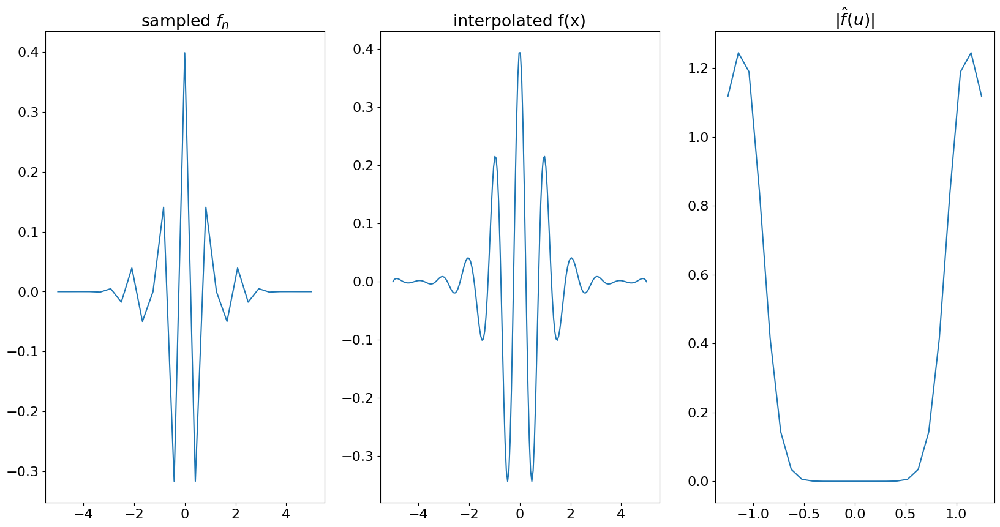

In [ ]:
X=5
samplingRate=.4
N=np.int(2*X/samplingRate)
B=N/(4*X)
sigma=1
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_gauss1p25XNyquist.png')

Second signal,

1.1x under sampling
sampling rate .5$\times$1.1, 1.1  times Nyquist

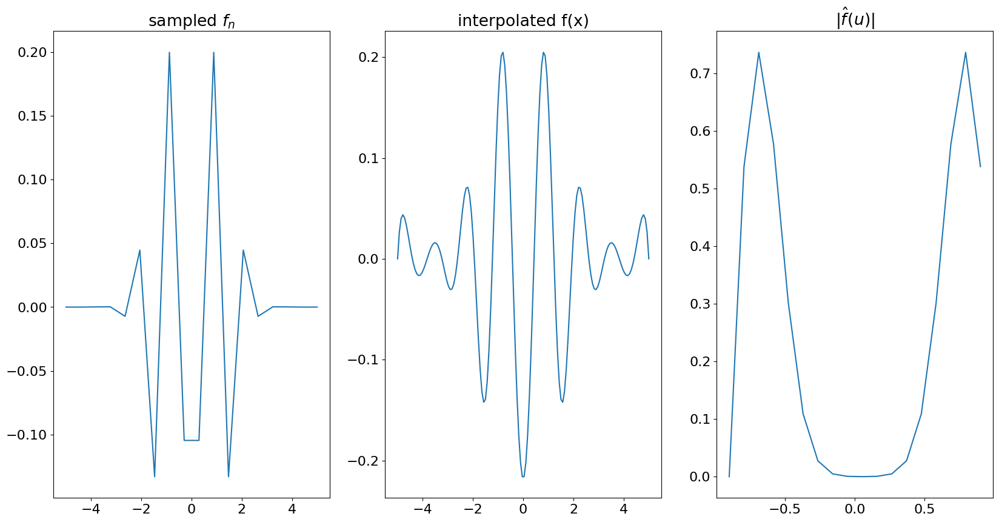

In [ ]:
X=5
samplingRate=.5*1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
sigma=1
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f
# interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('cos_gauss1p1XNyquist.png')

Third signal,

5x over sampling
sampling rate .1, 5 times Nyquist

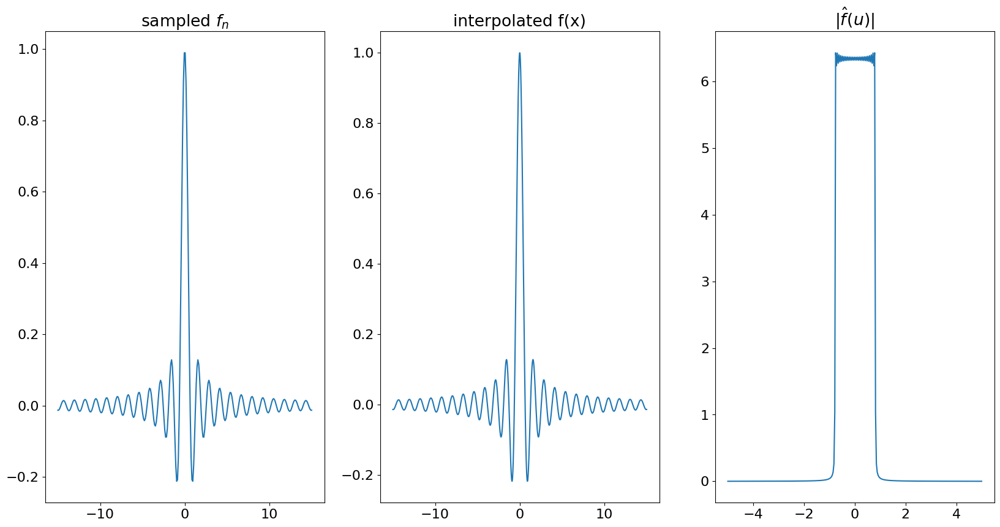

In [ ]:
X=15
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('sinc5XNyquist.png')

Third signal,

1.5x over sampling
sampling rate 1/3, 1.5 times Nyquist

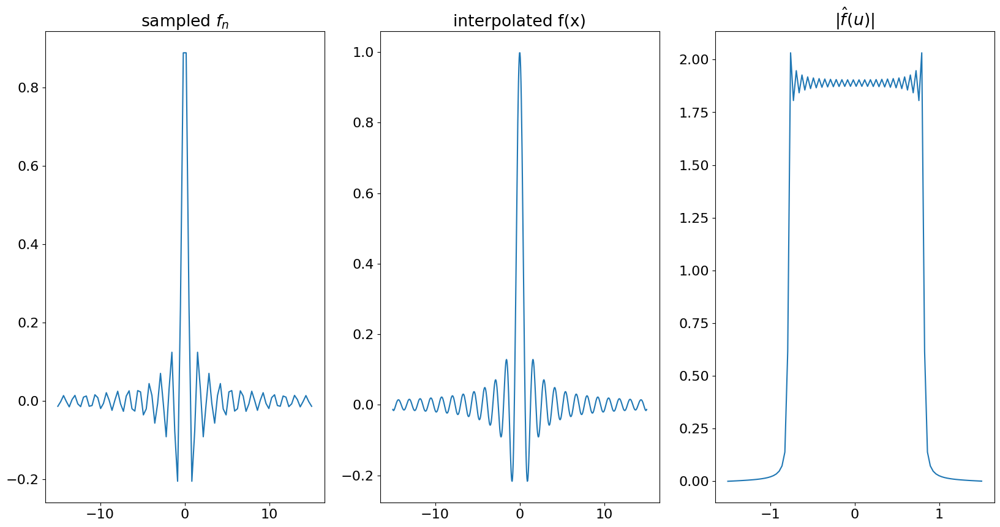

In [ ]:
X=15
samplingRate=1/3
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('sinc5XNyquist.png')

Third signal,

1.1x over sampling
sampling rate .5/1.1, 1.1 times Nyquist

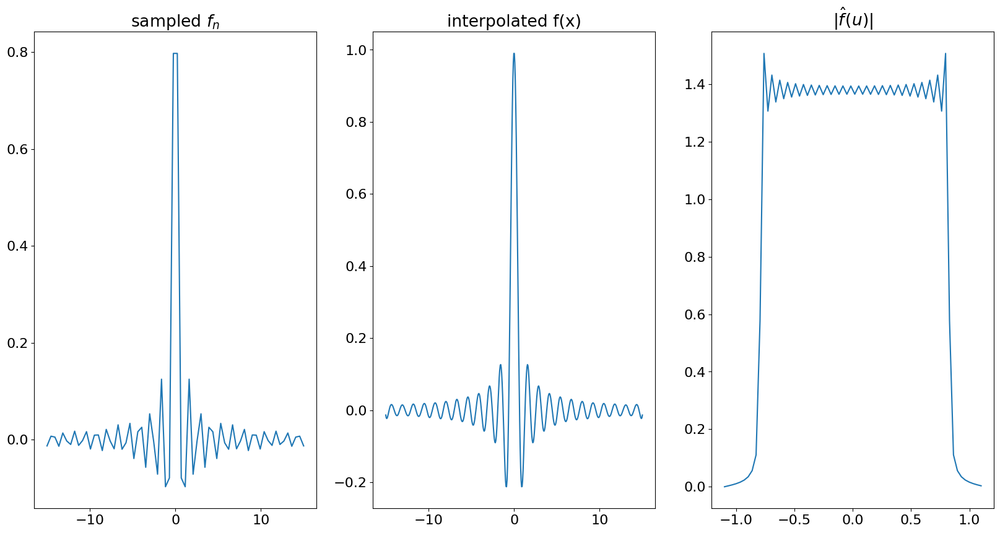

In [ ]:
X=15
samplingRate=.5/1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('sinc5XNyquist.png')

Third signal,

1.1x under sampling
sampling rate .5$\times$1.1, 1.1 times Nyquist

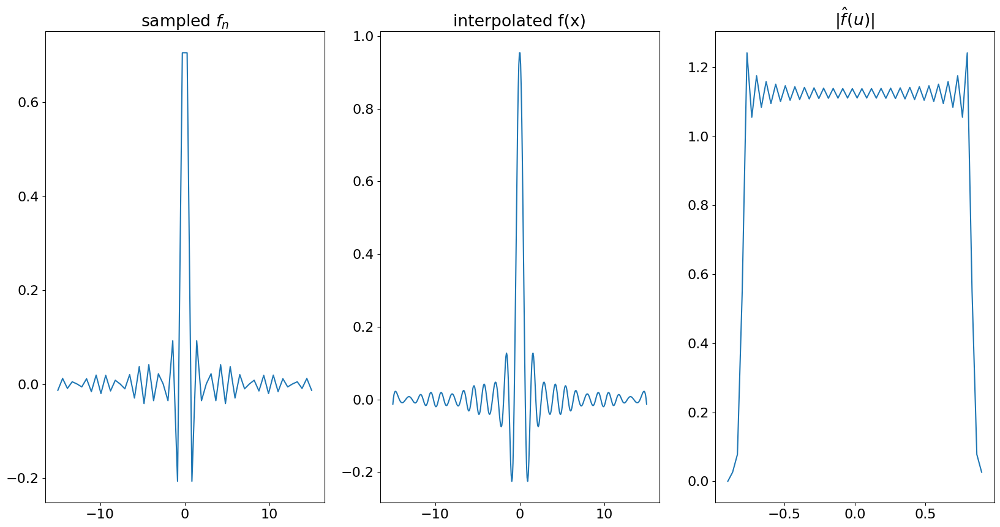

In [ ]:
X=15
samplingRate=.5*1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.sinc(.5*np.pi*x)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')
plt.savefig('sinc5XNyquist.png')

Harr sampling strategy setup

In [ ]:
X1=10
def f1(x):
  f1=np.cos(2*np.pi*x)*np.sinc(np.pi*x/5)
  return f1
def gn1(delta=1):
  N=np.int(2*X1/delta)
  gg=np.zeros(N)
  for pop in np.arange(len(gg)):
    gg[pop]=integrate.quad(f1,(-X1+pop*delta),(-X1+(pop+1)*delta))[0]
  return gg

X2=5
def f2(x):
  f2=np.cos(2*np.pi*x)*(1/(sigma*np.sqrt(2*np.pi))*np.exp(-(x)**2/(2*sigma**2)))
  return f2
def gn2(delta=1):
  N=np.int(2*X2/delta)
  gg=np.zeros(N)
  for pop in np.arange(len(gg)):
    gg[pop]=integrate.quad(f2,(-X2+pop*delta),(-X2+(pop+1)*delta))[0]
  return gg

X3=15
def f3(x):
  f3=np.sinc(.5*np.pi*x)
  return f3
def gn3(delta=1):
  N=np.int(2*X3/delta)
  gg=np.zeros(N)
  for pop in np.arange(len(gg)):
    gg[pop]=integrate.quad(f3,(-X3+pop*delta),(-X3+(pop+1)*delta))[0]
  return gg



Function 1 sampling periods

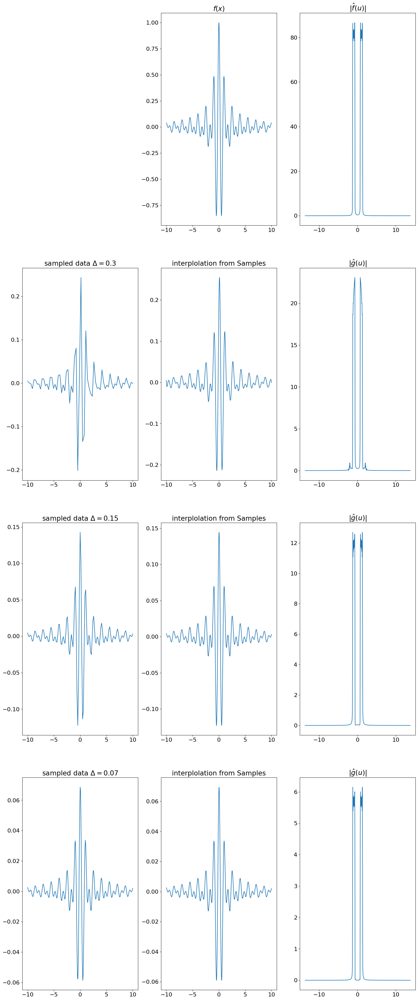

In [ ]:
plt.rcParams['figure.figsize'] = [20, 50]
X=10
xrange=np.linspace(-X,X,2048)
urange=np.linspace(-2048/(4*X),2048/(4*X),2048)
plt.subplot(4,3,2)
plt.plot(xrange,f1(xrange))
plt.title('$f(x)$')
plt.subplot(4,3,3)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(f1(xrange))))[750:1300])
plt.title('$|{\hat f}(u)|$')
plt.subplot(4,3,4)
gN=gn1(.3)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.3$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,5)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,6)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,7)
gN=gn1(.15)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.15$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,8)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,9)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,10)
gN=gn1(.07)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.07$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,11)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,12)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.savefig('sampleFiltering.png')




Function 2 sampling periods

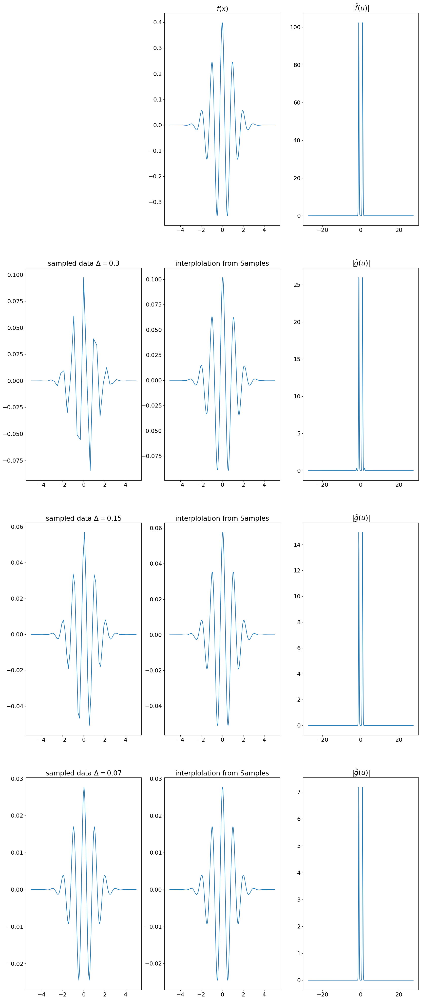

In [ ]:
plt.rcParams['figure.figsize'] = [20, 50]
X=5
xrange=np.linspace(-X,X,2048)
urange=np.linspace(-2048/(4*X),2048/(4*X),2048)
plt.subplot(4,3,2)
plt.plot(xrange,f2(xrange))
plt.title('$f(x)$')
plt.subplot(4,3,3)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(f2(xrange))))[750:1300])
plt.title('$|{\hat f}(u)|$')
plt.subplot(4,3,4)
gN=gn2(.3)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.3$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,5)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,6)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,7)
gN=gn2(.15)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.15$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,8)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,9)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,10)
gN=gn2(.07)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.07$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,11)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,12)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.savefig('sampleFiltering.png')




Function 3 sampling periods

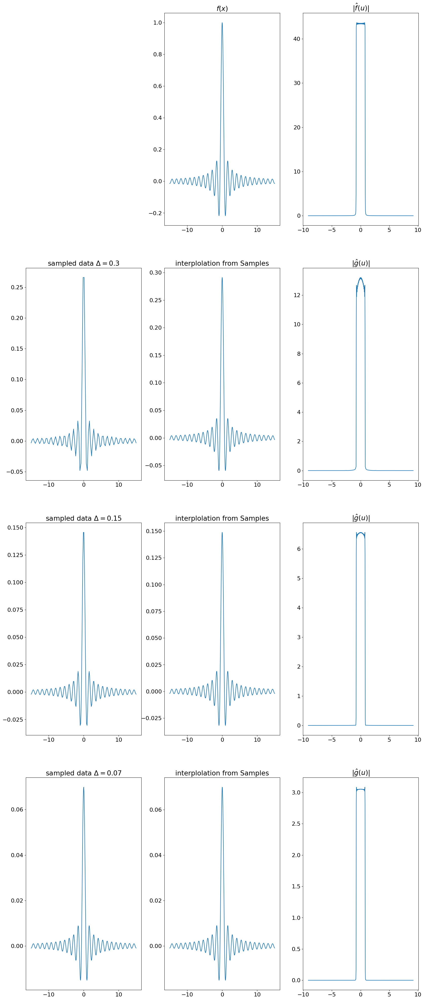

In [ ]:
plt.rcParams['figure.figsize'] = [20, 50]
X=15
xrange=np.linspace(-X,X,2048)
urange=np.linspace(-2048/(4*X),2048/(4*X),2048)
plt.subplot(4,3,2)
plt.plot(xrange,f3(xrange))
plt.title('$f(x)$')
plt.subplot(4,3,3)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(f3(xrange))))[750:1300])
plt.title('$|{\hat f}(u)|$')
plt.subplot(4,3,4)
gN=gn3(.3)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.3$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,5)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,6)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,7)
gN=gn3(.15)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.15$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,8)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,9)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,10)
gN=gn3(.07)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.07$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,11)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,12)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.savefig('sampleFiltering.png')




## Singular Value Spectra

This section has the various forward models for different values of H. The structure of forward models can be analyzed using spectral analysis. An $m\times n$ matrix $\mathbf{H}$ can be decomposed using singular value analysis into the for
$$
\mathbf{H}={\mathbf U\Lambda V'}
$$
where $\mathbf{U}$ is an $m\times m$ unitary matrix, $\mathbf{V}$ is an $n\times n$ unitary matrix and $\Lambda $ is a diagonal matrix. Here we look at the singular values and singular vectors for various example matrices.

The following models are based off 1D discrete impulse response integration over different matrices on a sampling range of 512 input pixels.

### 1 1 1 1 1 1 1 1 1

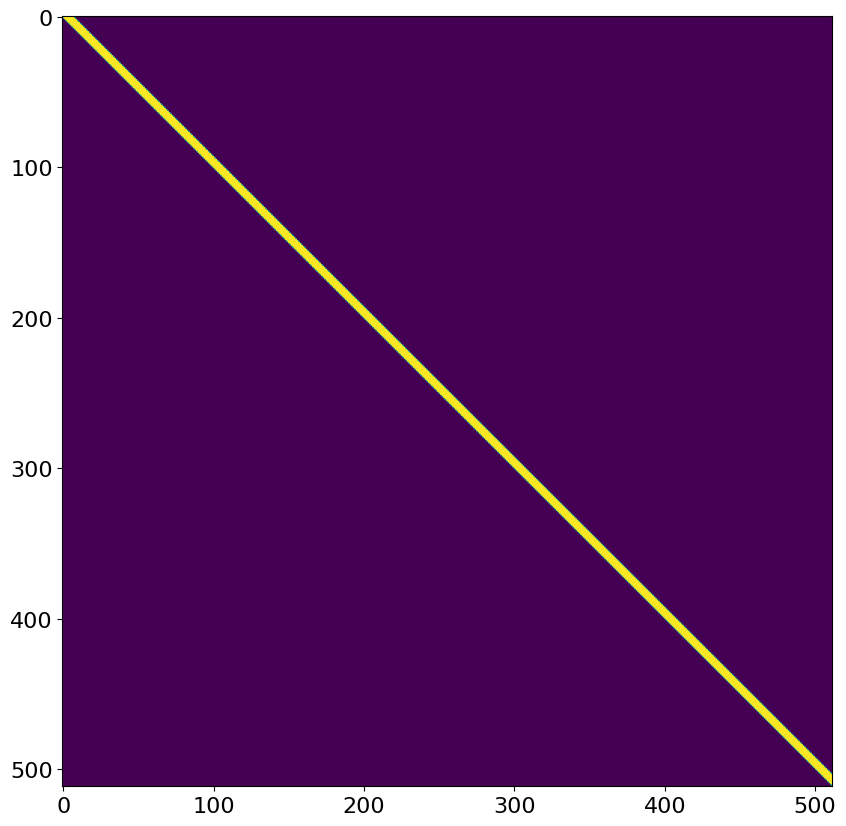

In [406]:
#
from scipy.linalg import toeplitz
psf=[1,1,1,1,1,1,1,1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.imshow(H)

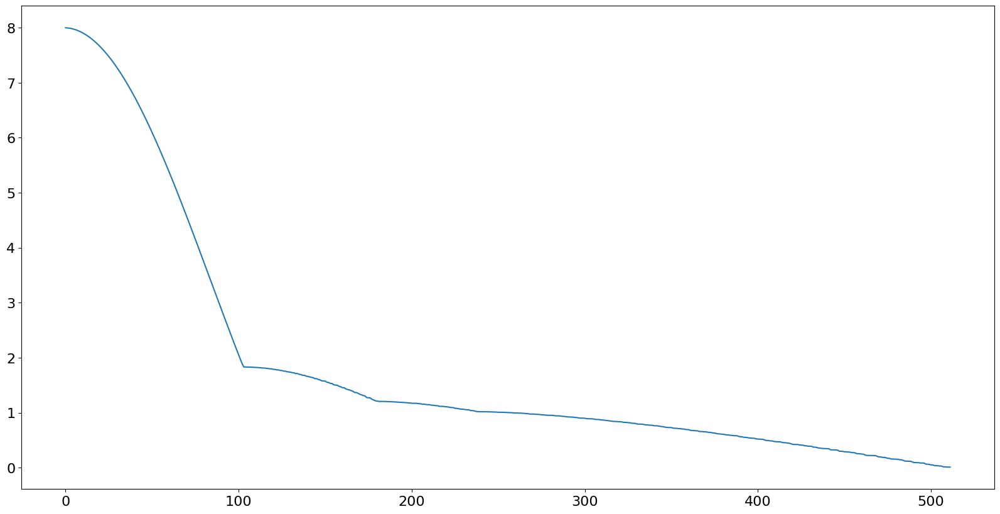

In [409]:
plt.plot(s)
plt.savefig('rectSpectrum.png')

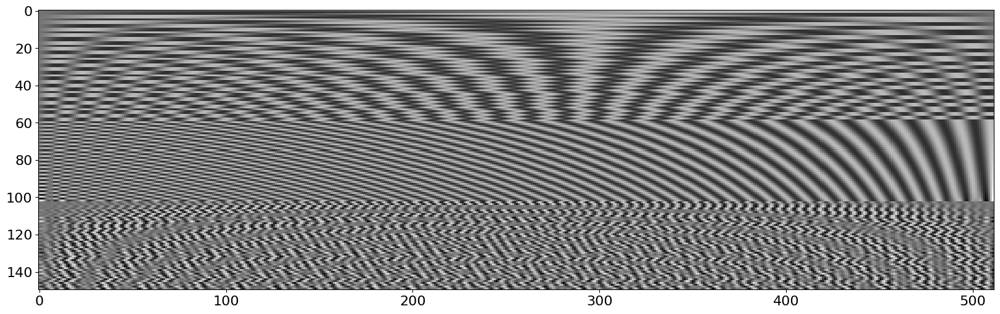

In [408]:
plt.imshow(vh[0:150,:],cmap='gray')
plt.savefig('rectVectors.png')

-1 1 -1 -1 1 -1 -1 1 -1

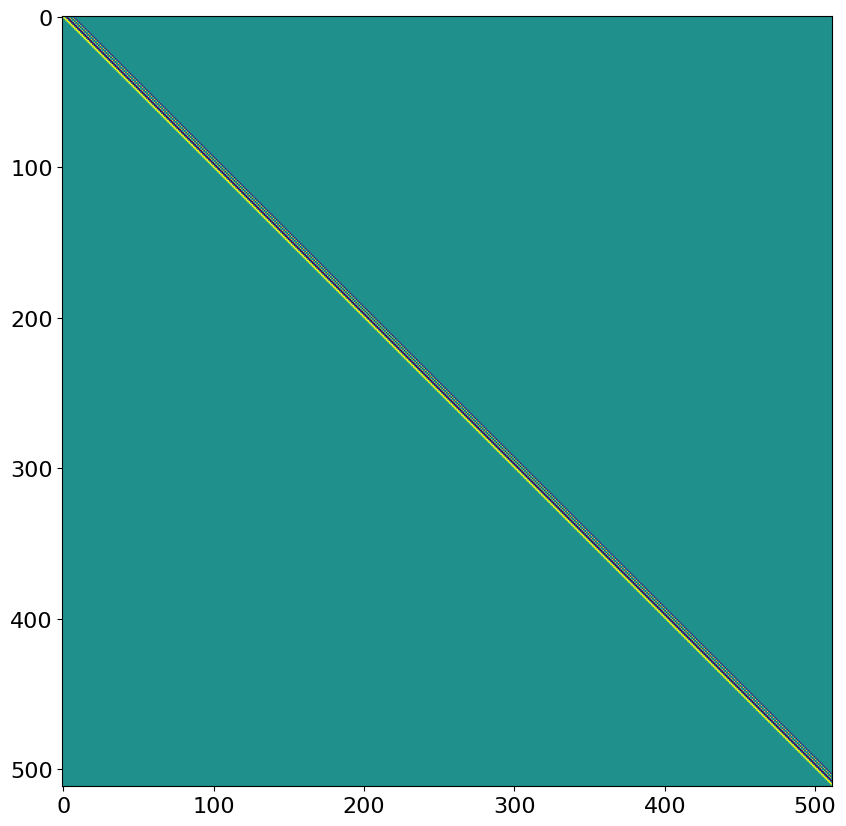

In [419]:
#
from scipy.linalg import toeplitz
psf=[-1,1,-1,-1,1,-1,1,-1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.imshow(H)

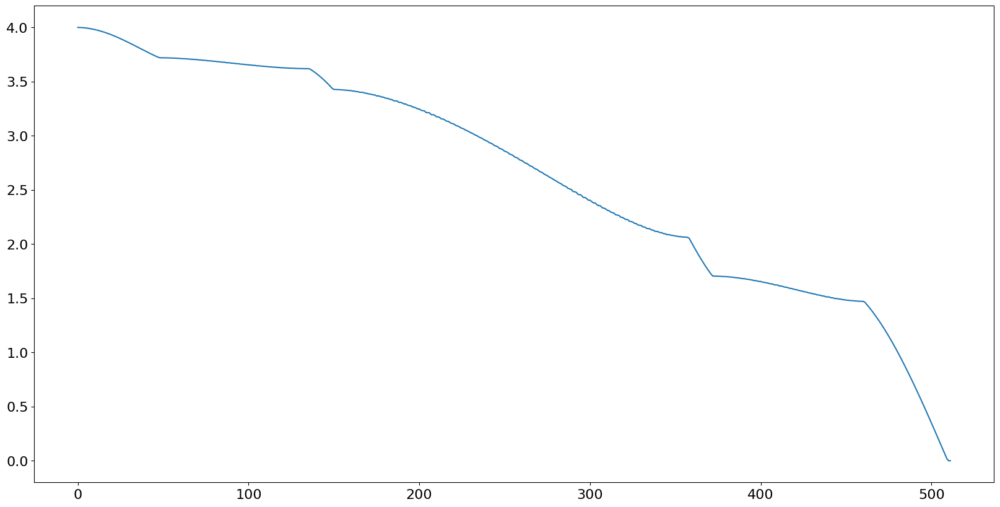

In [420]:
plt.plot(s)

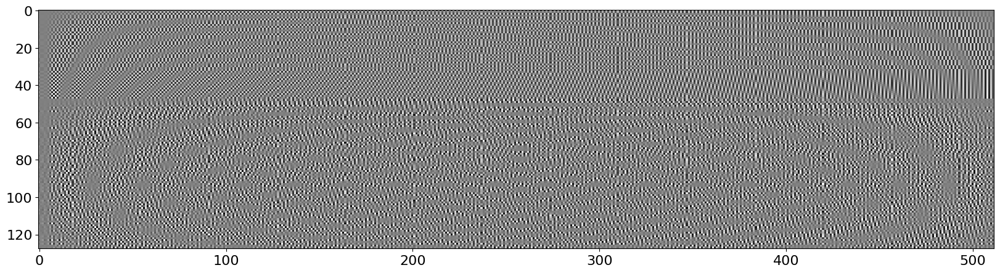

In [421]:
plt.imshow(vh[0:128,:],cmap='gray')

Tri(3,3,1)

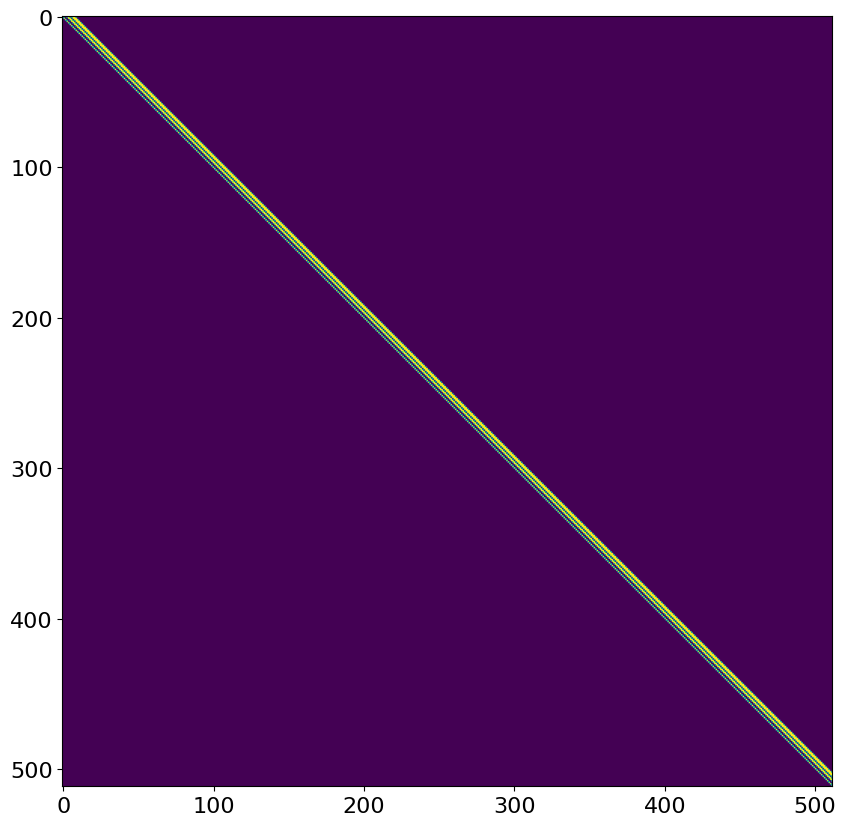

In [432]:
#

from scipy.linalg import toeplitz
psf=[1,0,0,1,1,0,1,1,1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=firstRow[0]
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.imshow(H)

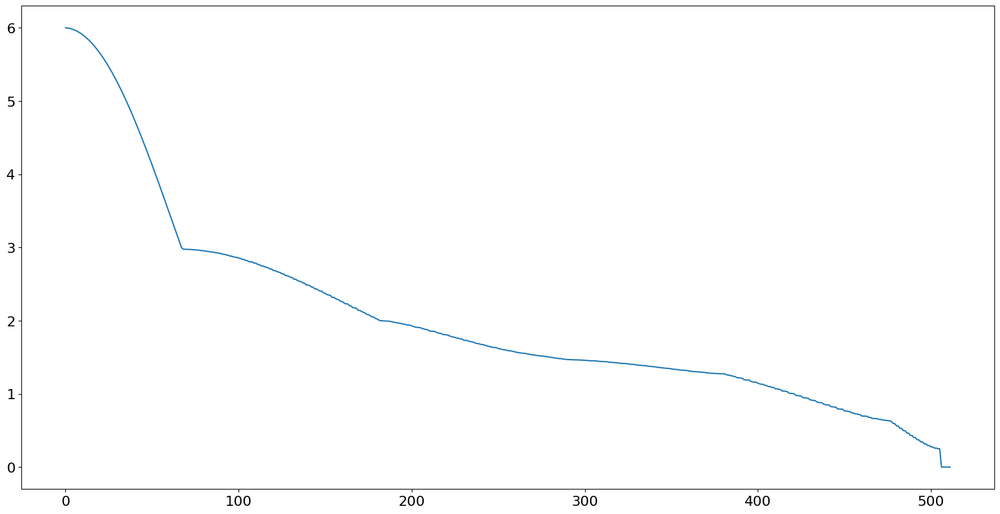

In [433]:
plt.plot(s)
plt.savefig('triSpectrum.png')

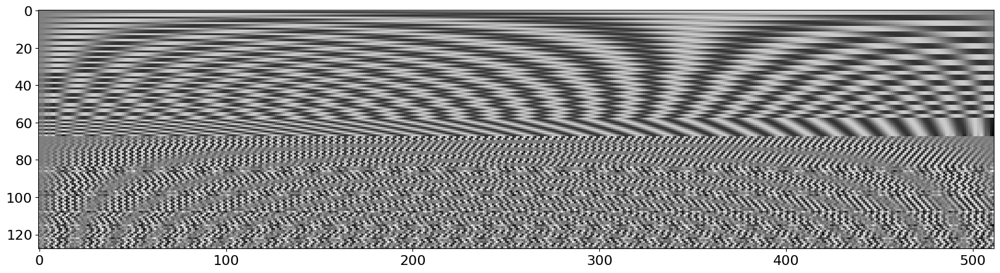

In [435]:
plt.imshow(vh[0:128,:],cmap='gray')
plt.savefig('triVectors.png')

### Random unipolar

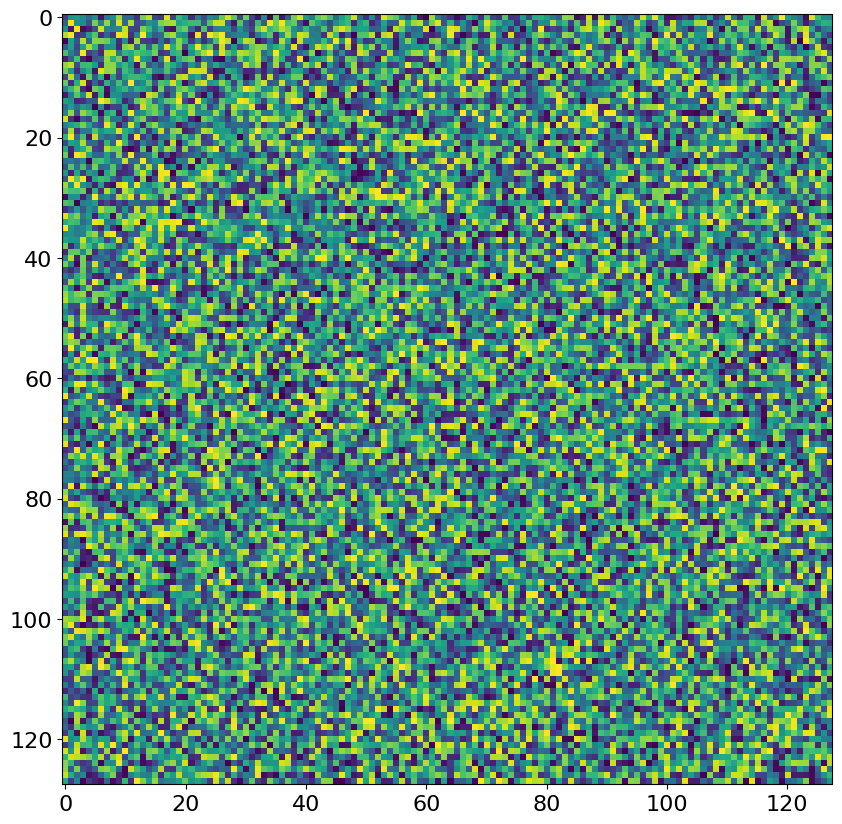

In [414]:
#
from scipy.linalg import toeplitz
H=np.random.random((128,128))
u, s, vh=np.linalg.svd(H)
plt.imshow(H)

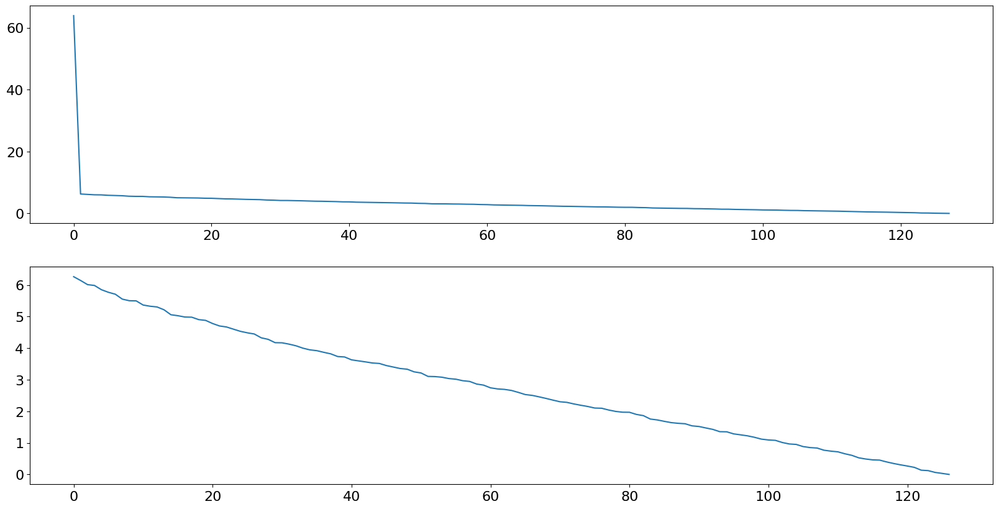

In [415]:
plt.subplot(2,1,1)
plt.plot(s)
plt.subplot(2,1,2)
plt.plot(s[1:])
plt.savefig('randomSpectrum.png')

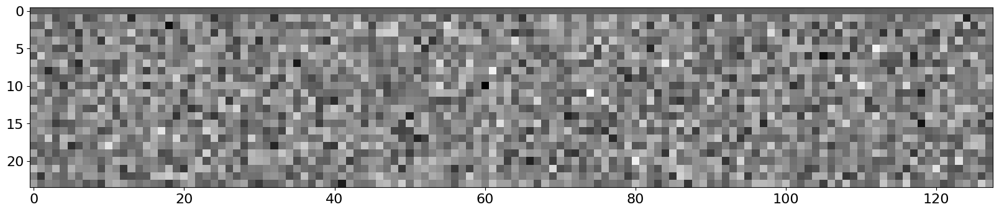

In [416]:
plt.imshow(vh[0:24,:],cmap='gray')

## Discussion


The real valued sampling matrix singular value decomposition finds real-valued U and V and orders the eignevalues according to signal strength rather than frequency (due to the discrete application). This leaves us with a shape of the singular value spectrum that is reminiscent of the the transform, and it falls monotonically to zero rather than showing oscillations.

When considering the vectors from 0 to 128, The lowest order singular vectors correspond to low spatial frequencies, but frequencies shown in the singular vectors shift abruptly to the next lobe in the sinc when the singular values in the current lobe fall sufficiently.

For the unipolar matrix, the zero frequency constant vector measuring the mean of the signal is the lowest order singular vector. The singular value spectrum including this component is shown at top, the spectrum starting with the second singular value is shown in the lower plot. A very strong low-order low-frequency singular vector is an inherent feature of unipolar sampling.